In [1]:
%env CUDA_DEVICE_ORDER=PCI_BUS_ID
# %env CUDA_VISIBLE_DEVICES=4
!nvidia-smi
%config InlineBackend.figure_format = 'retina'

env: CUDA_DEVICE_ORDER=PCI_BUS_ID
Mon Jun 23 12:24:05 2025       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 525.125.06   Driver Version: 525.125.06   CUDA Version: 12.0     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  NVIDIA A100-SXM...  On   | 00000000:01:00.0 Off |                    0 |
| N/A   75C    P0   158W / 275W |  76097MiB / 81920MiB |     51%      Default |
|                               |                      |             Disabled |
+-------------------------------+----------------------+----------------------+
|   1  NVIDIA A100-SXM...  On   | 00000000:47:00.0 Off

In [2]:
import hydra
from hydra.utils import instantiate
from hydra import initialize, compose

In [3]:
import sys
import os
import getpass

os.chdir('/home/' + getpass.getuser() + '/Projects/CaloQVAE/')
sys.path.insert(1, '/home/' + getpass.getuser() + '/Projects/CaloQVAE/')

In [4]:
#external libraries
import os
import pickle
import datetime
import sys
import yaml
import json

import torch.optim as optim
import torch
from torch import nn
from torch.nn.functional import binary_cross_entropy_with_logits
torch.manual_seed(32)
import numpy as np
np.random.seed(32)
import matplotlib.pyplot as plt
import hydra
from hydra.utils import instantiate

from omegaconf import OmegaConf

import time

# PyTorch imports
from torch import device, load, save
from torch.nn import DataParallel
from torch.cuda import is_available

# Add the path to the parent directory to augment search for module
sys.path.append(os.getcwd())
    
# Weights and Biases
import wandb

#self defined imports
from CaloQVAE import logging

[12:24:36.491] INFO   CaloQVAE                                          Willkommen!
[12:24:36.491] INFO   CaloQVAE                                          Loading configuration.


In [5]:
logger = logging.getLogger(__name__)

from data.dataManager import DataManager
from utils.plotting.plotProvider import PlotProvider
from engine.engine import Engine
from models.modelCreator import ModelCreator

from utils.plotting.HighLevelFeatures import HighLevelFeatures as HLF
# HLF_1_photons = HLF('photon', filename='/raid/javier/Datasets/CaloVAE/data/atlas/binning_dataset_1_photons.xml', wandb=False)
# HLF_1_pions = HLF('pion', filename='/raid/javier/Datasets/CaloVAE/data/atlas/binning_dataset_1_pions.xml', wandb=False)
# HLF_1_electron = HLF('electron', filename='/raid/javier/Datasets/CaloVAE/data/atlas_dataset2and3/binning_dataset_2.xml', wandb=False)

2025-06-23 12:24:38,068 dwave.cloud INFO  MainThread Log level for 'dwave.cloud' namespace set to 0
[12:24:38.068] INFO   dwave.cloud                                       Log level for 'dwave.cloud' namespace set to 0


In [6]:
hydra.core.global_hydra.GlobalHydra.instance().clear()
initialize(version_base=None, config_path="configs")

hydra.initialize()

In [7]:

# config=compose(config_name="config.yaml")
config=compose(config_name="config.yaml")

HLF_1_photons = HLF('photon', filename=config.data.binning_xml_photons, wandb=False)
HLF_1_pions = HLF('pion', filename=config.data.binning_xml_pions, wandb=False)
HLF_1_electron = HLF('electron', filename=config.data.binning_xml_electrons, wandb=False)

wandb.init(project="caloqvae", entity=config.data.entity, config=config, mode='disabled')
modelCreator = ModelCreator(cfg=config)
dataMgr = DataManager(cfg=config)
#initialise data loaders
dataMgr.init_dataLoaders()
#run pre processing: get/set input dimensions and mean of train dataset
dataMgr.pre_processing()

if config.model.activation_fct.lower()=="relu":
    modelCreator.default_activation_fct=torch.nn.ReLU()
elif config.model.activation_fct.lower()=="tanh":
    modelCreator.default_activation_fct=torch.nn.Tanh()
else:
    logger.warning("Setting identity as default activation fct")
    modelCreator.default_activation_fct=torch.nn.Identity()

#instantiate the chosen model
#loads from file 
model=modelCreator.init_model(dataMgr=dataMgr)

#create the NN infrastructure
model.create_networks()

/raid/javier/anaconda3/lib/python3.11/site-packages/hydra/_internal/defaults_list.py:251: UserWarning: In 'config.yaml': Defaults list is missing `_self_`. See https://hydra.cc/docs/1.2/upgrades/1.0_to_1.1/default_composition_order for more information
  warnings.warn(msg, UserWarning)
[12:24:39.675] INFO   data.dataManager                                  Loading Data
[12:25:02.689] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7fa000e32e90>: 80000 events, 157 batches
[12:25:02.691] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7fa000e32590>: 1000 events, 1 batches
[12:25:02.691] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7fa000e4f850>: 19000 events, 19 batches
[12:25:05.153] INFO   models.modelCreator                               Initialising Model Type AtlasConditionalQVAE3DHD
2025-06-23 12:25

Initializing NetworkV3
Layer Inputs:  [1208, 3368, 3368, 3368]
Layer Outputs:  [2160, 2160, 2160, 6480]
Raw Layer Indices:  [0, 2160, 2160, 2160, 6480]
Initializing NetworkV3
Initializing NetworkV3
Initializing NetworkV3
Initializing NetworkV3


In [8]:
#Not printing much useful info at the moment to avoid clutter. TODO optimise
model.print_model_info()
# for name, param in model.named_parameters():
#         print(name, param.requires_grad)

# Load the model on the GPU if applicable
# dev = None
# if (config.device == 'gpu') and config.gpu_list:
#     logger.info('Requesting GPUs. GPU list :' + str(config.gpu_list))
#     devids = ["cuda:{0}".format(x) for x in list(config.gpu_list)]
#     logger.info("Main GPU : " + devids[0])

#     if is_available():
#         print(devids[0])
#         dev = device(devids[0])
#         if len(devids) > 1:
#             logger.info(f"Using DataParallel on {devids}")
#             model = DataParallel(model, device_ids=list(config.gpu_list))
#         logger.info("CUDA available")
#     else:
#         dev = device('cpu')
#         logger.info("CUDA unavailable")
# else:
#     logger.info('Requested CPU or unable to use GPU. Setting CPU as device.')
#     dev = device('cpu')
# dev = torch.device("cuda:0")
dev = "cuda:{0}".format(config.gpu_list[0])

# Send the model to the selected device
# model.to(dev)
# Log metrics with wandb
wandb.watch(model)

# For some reason, need to use postional parameter cfg instead of named parameter
# with updated Hydra - used to work with named param but now is cfg=None 
engine=instantiate(config.engine, config)

#TODO for some reason hydra double instantiates the engine in a
#newer version if cfg=config is passed as an argument. This is a workaround.
#Find out why that is...
engine._config=config
#add dataMgr instance to engine namespace
engine.data_mgr=dataMgr
#add device instance to engine namespace
engine.device=dev    
#instantiate and register optimisation algorithm
engine.optimiser = torch.optim.Adam(model.parameters(),
                                    lr=config.engine.learning_rate)
#add the model instance to the engine namespace
engine.model = model
# add the modelCreator instance to engine namespace
engine.model_creator = modelCreator
engine.model = engine.model.to(dev)

[12:25:07.896] INFO   wandb                                             Watching
/raid/javier/anaconda3/lib/python3.11/site-packages/coffea/util.py:154: FutureWarning: In coffea version v2023.3.0 (target date: 31 Mar 2023), this will be an error.
(Set coffea.deprecations_as_errors = True to get a stack trace now.)
ImportError: coffea.hist is deprecated
  warnings.warn(message, FutureWarning)
[12:25:08.284] INFO   engine.engineAtlas                                Setting up engine Atlas.
[12:25:08.284] INFO   engine.engineCaloV3                               Setting up engine Calo.
[12:25:08.285] INFO   engine.engine                                     Setting up default engine.


In [9]:
train_loader,test_loader,val_loader = engine.data_mgr.create_dataLoader()

[12:25:32.595] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7fa00186ef90>: 80000 events, 157 batches
[12:25:32.597] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7f9f94738050>: 1000 events, 1 batches
[12:25:32.597] INFO   data.dataManager                                  <torch.utils.data.dataloader.DataLoader object at 0x7fa0019a3890>: 19000 events, 19 batches


In [10]:
engine.model._qpu_sampler.properties["chip_id"]

'Advantage2_prototype2.6'

In [21]:
    
    
# RBM centered + pos energy BP to encoder. Final beta 100 Ian model :: CURRENT BEST
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-05/12-28-38/wandb/run-20250505_122838-yxe5n555/files/AtlasConditionalQVAE3DHD_atlas_default_250.pth"
modelname = 'old-parsec-80'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-05-05/12-28-38/wandb/run-20250505_122838-yxe5n555/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False
    
# RBM centered + pos energy BP to encoder. Final beta 100 Ian model
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-23/20-20-11/wandb/run-20250526_183546-edavl0yy/files/AtlasConditionalQVAE3DHD_atlas_default_240.pth"
modelname = 'lemon-flower-113'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-05-23/20-20-11/wandb/run-20250526_183546-edavl0yy/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False


# # RBM centered + pos energy BP to encoder. Final beta 100 Ian model std 0.01
# run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-30/18-51-52/wandb/run-20250602_004926-e99niuxf/files/AtlasConditionalQVAE3DHD_atlas_default_250.pth"
# # run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-30/18-51-52/wandb/run-20250530_185153-e99niuxf/files/AtlasConditionalQVAE3DHD_atlas_default_10.pth"
# modelname = 'generous-water-216'
# datascaled = 'reduced'
# with open("/home/javier/Projects/CaloQVAE/outputs/2025-05-30/18-51-52/wandb/run-20250602_004926-e99niuxf/files/config.yaml", 'r') as file:
#     model_config = yaml.safe_load(file)
#     R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
#     reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
#     scaled=False
    
    
# # RBM centered + pos energy BP to encoder. Final beta 100 Ian model std 0.01 on some weight matrices
# run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-06-06/21-52-55/wandb/run-20250609_212029-6frlej5z/files/AtlasConditionalQVAE3DHD_atlas_default_240.pth"
# # run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-05-30/18-51-52/wandb/run-20250530_185153-e99niuxf/files/AtlasConditionalQVAE3DHD_atlas_default_10.pth"
# modelname = 'usual-leaf-269'
# datascaled = 'reduced'
# with open("/home/javier/Projects/CaloQVAE/outputs/2025-06-06/21-52-55/wandb/run-20250609_212029-6frlej5z/files/config.yaml", 'r') as file:
#     model_config = yaml.safe_load(file)
#     R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
#     reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
#     scaled=False
    
    
# # RBM centered + pos energy BP to encoder. Final beta 100 Ian model std 0.01 on some weight matrices
# # run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-06-11/20-46-13/wandb/run-20250611_204614-4f745nwj/files/AtlasConditionalQVAE3DHD_atlas_default_190.pth"
# run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-06-11/20-46-13/wandb/run-20250617_184637-4f745nwj/files/AtlasConditionalQVAE3DHD_atlas_default_290.pth"
# modelname = 'divine-meadow-318'
# datascaled = 'reduced'
# with open("/home/javier/Projects/CaloQVAE/outputs/2025-06-11/20-46-13/wandb/run-20250611_204614-4f745nwj/files/config.yaml", 'r') as file:
#     model_config = yaml.safe_load(file)
#     R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
#     reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
#     scaled=False

# RBM centered + pos energy BP to encoder. Final beta 100 Ian model std 0.01 on some weight matrices. Entropy made 0. Fully connected
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-06-20/19-35-49/wandb/run-20250620_193550-1hpkh10n/files/AtlasConditionalQVAE3DHD_atlas_default_130.pth"
modelname = 'legendary-galaxy-345'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-06-20/19-35-49/wandb/run-20250620_193550-1hpkh10n/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False
    
# RBM centered + pos energy BP to encoder. Final beta 100 Ian model std 0.01 on some weight matrices. Entropy made 0
run_path = "/home/javier/Projects/CaloQVAE/outputs/2025-06-22/16-51-36/wandb/run-20250622_165137-50fhcm5s/files/AtlasConditionalQVAE3DHD_atlas_default_60.pth"
modelname = 'legendary-galaxy-345'
datascaled = 'reduced'
with open("/home/javier/Projects/CaloQVAE/outputs/2025-06-22/16-51-36/wandb/run-20250622_165137-50fhcm5s/files/config.yaml", 'r') as file:
    model_config = yaml.safe_load(file)
    R = json.loads(model_config["_content"]["value"]['engine'].replace("'", "\""))['r_param']
    reducedata = True if model_config["_content"]["value"]["reducedata"] == 'True' else False
    scaled=False
    
arch = config['model']['model_type']
part = config['data']['particle_type']
print(arch)
print(part)
print(scaled, reducedata, R)


# load_state(model, run_path, 'cuda:{0}'.format(cfg.gpu_list[0]))
# load_state(model, run_path, dev)
modelCreator.load_state(run_path, dev)
engine.model.eval();

[14:03:15.254] INFO   models.modelCreator                               Loading state


AtlasConditionalQVAE3DHD
electron-ds2
False True 1e-07


[14:03:15.676] INFO   models.modelCreator                               Loading weights from file : /home/javier/Projects/CaloQVAE/outputs/2025-06-22/16-51-36/wandb/run-20250622_165137-50fhcm5s/files/AtlasConditionalQVAE3DHD_atlas_default_60.pth


Loading weights for module =  _activation_fct
Loading weights for module =  _bce_loss
Loading weights for module =  _energy_activation_fct
Loading weights for module =  _hit_activation_fct
Loading weights for module =  _output_loss
Loading weights for module =  _hit_loss
Loading weights for module =  _hit_smoothing_dist_mod
Loading weights for module =  _inference_energy_activation_fct
Loading weights for module =  encoder
Loading weights for module =  prior
Loading weights for module =  decoder


In [12]:
xx = next(iter(test_loader))
in_data, true_energy, in_data_flat = engine._preprocess(xx[0],xx[1]) # input , label

In [13]:
true_energy[4]

tensor([48177.5625], device='cuda:2')

tensor([5103.1440], device='cuda:2')


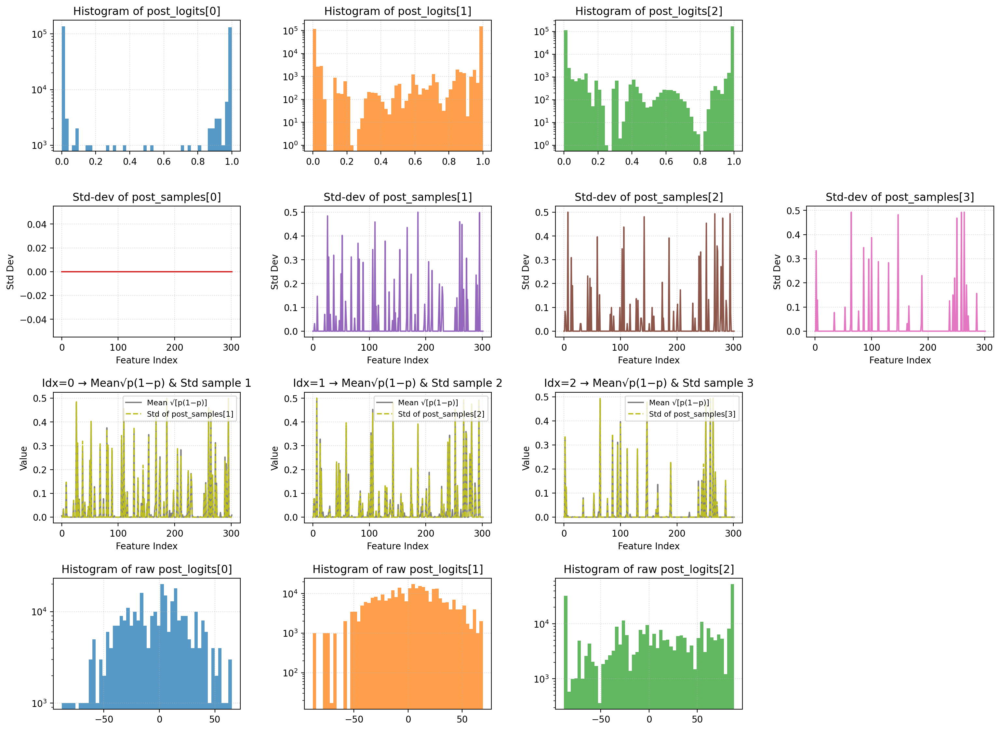

In [22]:
idx = 0
print(true_energy[idx])
engine.model.eval()
with torch.no_grad():
    fwd_output = engine.model((in_data[idx,:].repeat(1000,1), true_energy[idx,0].repeat(1000,1)), False)
    # Define distinct colors for each subplot type
    hist_colors   = ['C0', 'C1', 'C2']
    line_colors   = ['C3', 'C4', 'C5', 'C6']
    combo_colors  = ['C7', 'C8']  # for the third‐row overlay plots

    # Create a 3×4 grid of subplots
    fig, axes = plt.subplots(4, 4, figsize=(16, 12))
    fig.tight_layout(pad=4.0)

    # -----------------------------
    # ROW 0: Three Histograms + 1 Empty
    # -----------------------------
    for idx in range(3):
        ax = axes[0, idx]
        data = nn.Sigmoid()(fwd_output.post_logits[idx]) \
                 .view(-1) \
                 .detach() \
                 .cpu() \
                 .numpy()
        ax.hist(data, bins=50, log=True, color=hist_colors[idx], alpha=0.75)
        ax.set_title(f"Histogram of post_logits[{idx}]")
        ax.grid(True, linestyle=':', alpha=0.5)

    # Leave the last cell in row 0 empty
    axes[0, 3].axis('off')


    # -----------------------------
    # ROW 1: Four Std‐Dev Line Plots (post_samples[idx].std)
    # -----------------------------
    for idx in range(4):
        ax = axes[1, idx]
        std_vals = (
            fwd_output.post_samples[idx]
            .to(dtype=torch.float32)
            .std(dim=0)
            .detach()
            .cpu()
            .numpy()
        )
        ax.plot(std_vals, color=line_colors[idx], linewidth=1.5)
        ax.set_title(f"Std‐dev of post_samples[{idx}]")
        ax.set_xlabel("Feature Index")
        ax.set_ylabel("Std Dev")
        ax.grid(True, linestyle=':', alpha=0.5)


    # -----------------------------
    # ROW 2: Overlay of Mean√[p(1−p)] & Next Sample’s Std (for idx=0,1,2)
    # -----------------------------
    for idx in range(3):
        ax = axes[2, idx]

        # Compute: √[p * (1 − p)] averaged over batch for post_logits[idx]
        p = nn.Sigmoid()(fwd_output.post_logits[idx])
        mean_sqrt = (
            (p * (1 - p))
            .sqrt()
            .mean(dim=0)
            .detach()
            .cpu()
            .numpy()
        )

        # Compute: std‐dev of post_samples[idx+1] across axis=0
        std_next = (
            fwd_output.post_samples[idx + 1]
            .to(dtype=torch.float32)
            .std(dim=0)
            .detach()
            .cpu()
            .numpy()
        )

        ax.plot(mean_sqrt, color=combo_colors[0], linestyle='-', linewidth=1.5,
                label='Mean √[p(1−p)]')
        ax.plot(std_next, color=combo_colors[1], linestyle='--', linewidth=1.5,
                label=f'Std of post_samples[{idx+1}]')
        ax.set_title(f"Idx={idx} → Mean√p(1−p) & Std sample {idx+1}")
        ax.set_xlabel("Feature Index")
        ax.set_ylabel("Value")
        ax.legend(loc='upper right', fontsize='small')
        ax.grid(True, linestyle=':', alpha=0.5)

    # Leave the last cell in row 2 empty
    axes[2, 3].axis('off')
    
    # -----------------------------
    # ROW 3: Three Histograms + 1 Empty
    # -----------------------------
    for idx in range(3):
        ax = axes[3, idx]
        data = fwd_output.post_logits[idx] \
                 .view(-1) \
                 .detach() \
                 .cpu() \
                 .numpy()
        ax.hist(data, bins=50, log=True, color=hist_colors[idx], alpha=0.75)
        ax.set_title(f"Histogram of raw post_logits[{idx}]")
        ax.grid(True, linestyle=':', alpha=0.5)

    # Leave the last cell in row 0 empty
    axes[3, 3].axis('off')

    plt.show()


/tmp/ipykernel_4028776/2465146256.py:19: UserWarning: The figure layout has changed to tight
  fig.tight_layout(pad=4.0)


0.0534
0.0764
0.044
0.1121
0.8725
0.2468


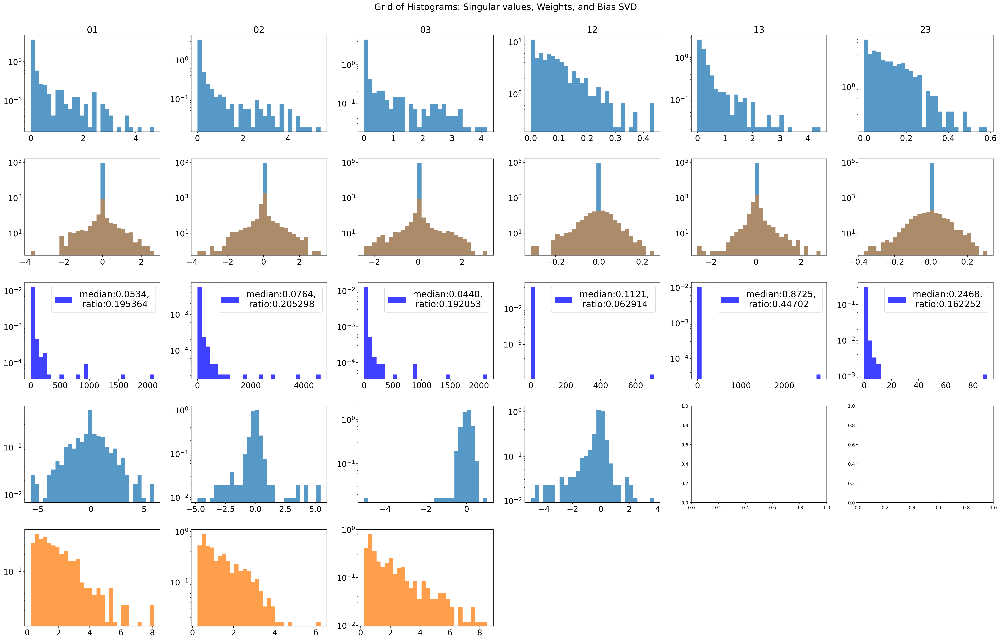

In [23]:
engine.model.eval()
F = {}
bias_svd_u = {}
bias_svd_v = {}
for key in engine.model.prior.weight_dict.keys():
    F[key] = torch.svd(engine.model.prior.weight_dict[key].detach().cpu())
    bias_svd_u[key] = {}
    bias_svd_v[key] = {}
    for key_2 in engine.model.prior.bias_dict.keys():
        bias_svd_u[key][key_2] = F[key].U.transpose(0,1) @ engine.model.prior.bias_dict[key_2].detach().cpu()
        bias_svd_v[key][key_2] = F[key].V.transpose(0,1) @ engine.model.prior.bias_dict[key_2].detach().cpu()

# Assume engine, F, bias_svd are already defined and engine.model.prior.weight_dict has exactly 8 keys.
keys = list(engine.model.prior.weight_dict.keys())  # length = 8
bias_keys = list(engine.model.prior.bias_dict.keys())

# Create a 3×8 grid of subplots
fig, axes = plt.subplots(nrows=5, ncols=6, figsize=(32, 20), constrained_layout=True)
fig.tight_layout(pad=4.0)

# Row 0: Histograms of F[key].S for each of the 8 keys
for col, key in enumerate(keys):
    ax = axes[0, col]
    values = F[key].S.numpy().ravel()
    ax.hist(values, bins=30, log=True, label=key, alpha=0.75, density=True)
    ax.set_title(f"{key}", fontsize=20)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)
    

# Row 1: Histograms of prior.weight_dict[key] for each of the 8 keys
for col, key in enumerate(keys):
    ax = axes[1, col]
    w_vals = engine.model.prior.weight_dict[key].view(-1).detach().cpu().numpy()
    ax.hist(w_vals, bins=30, log=True, label=key, alpha=0.75, density=False)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)
    # ax.set_title(f"weights[{key}]")
    # ax.legend(fontsize="small")
    
# Row 1: Histograms of prior.weight_dict[key] for each of the 8 keys
for col, key in enumerate(keys):
    ax = axes[1, col]
    # w_vals = engine.model.prior.weight_dict[key].view(-1).detach().cpu().numpy()
    tmp = engine.model.prior.weight_dict[key].abs() > 0.0 
    w_vals = engine.model.prior.weight_dict[key][tmp].view(-1).detach().cpu().numpy()
    ax.hist(w_vals, bins=30, log=True, alpha=0.5, label=key, density=False)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)
    # ax.set_title(f"weights[{key}]")
    
# Row 2: Histograms of prior.weight_dict[key] for each of the 8 keys
for col, key in enumerate(keys):
    ax = axes[2, col]
    # w_vals = (engine.model.prior.weight_dict[key].sum(dim=1) / engine.model.prior.bias_dict[key[0]]).detach().cpu().numpy()
    w_vals = (engine.model.prior._weight_mask_dict[key].sum(dim=1) * engine.model.prior.weight_dict[key].pow(2).mean(dim=1).sqrt() / engine.model.prior.bias_dict[key[0]]).abs().detach().cpu().numpy()
    ratio = np.around((w_vals >= 1).sum()/w_vals.shape[0],6)
    med = np.around(np.median(w_vals),4)
    print(med)
    ax.hist(w_vals, bins=30, log=True, color='blue', label=f'median:{"{:0.4f}".format(med)}, \n ratio:{ratio}', alpha=0.75, density=True)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)
    ax.legend(fontsize=20)

    
# Row 3: Histograms of prior.weight_dict[key] for each of the 8 keys
for col, key in enumerate(bias_keys):
    ax = axes[3, col]
    w_vals = engine.model.prior.bias_dict[key].view(-1).detach().cpu().numpy()
    ax.hist(w_vals, bins=30, log=True, label=key, alpha=0.75, density=True)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)

# Row 4: Histograms of prior.weight_dict[key] for each of the 8 keys
for col, key in enumerate(bias_keys):
    ax = axes[4, col]
    if col==0:
        w_vals = (engine.model.prior.bias_dict['1'].abs() \
           + engine.model.prior.weight_dict['01'].pow(2).sum(dim=0).sqrt() \
           + engine.model.prior.weight_dict['12'].pow(2).sum(dim=1).sqrt() \
           + engine.model.prior.weight_dict['13'].pow(2).sum(dim=0).sqrt()).detach().cpu().numpy()
        ax.hist(w_vals, bins=30, log=True, label=key, color='C1', alpha=0.75, density=True)
    elif col==1:
        w_vals = (engine.model.prior.bias_dict['2'].abs() \
           + engine.model.prior.weight_dict['02'].pow(2).sum(dim=0).sqrt() \
           + engine.model.prior.weight_dict['12'].pow(2).sum(dim=0).sqrt() \
           + engine.model.prior.weight_dict['23'].pow(2).sum(dim=1).sqrt()).detach().cpu().numpy()
        ax.hist(w_vals, bins=30, log=True, label=key, color='C1', alpha=0.75, density=True)
    elif col==2:
        w_vals = (engine.model.prior.bias_dict['3'].abs() \
           + engine.model.prior.weight_dict['03'].pow(2).sum(dim=0).sqrt() \
           + engine.model.prior.weight_dict['13'].pow(2).sum(dim=0).sqrt() \
           + engine.model.prior.weight_dict['23'].pow(2).sum(dim=0).sqrt()).detach().cpu().numpy()
        ax.hist(w_vals, bins=30, log=True, label=key, color='C1', alpha=0.75, density=True)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)

    axes[4, 3].axis('off')
    axes[4, 4].axis('off')
    axes[4, 5].axis('off')


        
# for row, bkey in enumerate(bias_keys):
#     for col, key in enumerate(keys):
#         ax = axes[row+4, col]
#         b_vals = bias_svd_u[key][bkey].numpy().ravel()
#         ax.hist(b_vals, bins=30, log=True, color='m', label=bkey)
#     # axes[row+4, 0].text(
#     #     1.5, 10.5, 
#     #     "Projected bias on U", 
#     #     ha="center", va="center", 
#     #     fontsize=25, 
#     # )
    
# for row, bkey in enumerate(bias_keys):
#     for col, key in enumerate(keys):
#         ax = axes[row+8, col]
#         b_vals = bias_svd_v[key][bkey].numpy().ravel()
#         ax.hist(b_vals, bins=30, log=True, color='orange', label=bkey)
#     # axes[row+8, 0].text(
#     #     1.5, 10.5, 
#     #     "Projected bias on V", 
#     #     ha="center", va="center", 
#     #     fontsize=25, 
#     # )

# Add an overall title and display
fig.suptitle("Grid of Histograms: Singular values, Weights, and Bias SVD", fontsize=20, y=1.02)
# plt.savefig(f'/home/javier/Projects/CaloQVAE/figs/{modelname}/RBM_parameters_{modelname}_{arch}.png')
plt.show()


In [16]:
p1, p2, p3, p4 = engine.model.sampler.block_gibbs_sampling_cond(fwd_output.post_samples[0].to(dtype=torch.float32))


In [17]:
rbm_data = []
for el in [p1,p2,p3,p4]:
    rbm_data.append(el)

In [18]:
# rbm_data[1][0]

In [19]:
corr_matrix_data = {}
corr_matrix_rbm = {}
for i in range(4):
    for j in range(i,4):
        key = str(i)+str(j)
        corr_matrix_data[key] = (fwd_output.post_samples[i].to(dtype=torch.float).transpose(1,0) @ fwd_output.post_samples[j].to(dtype=torch.float) / 1000).detach().cpu().numpy()
        corr_matrix_rbm[key] = (rbm_data[i].to(dtype=torch.float).transpose(1,0) @ rbm_data[j].to(dtype=torch.float) / 1000).detach().cpu().numpy()

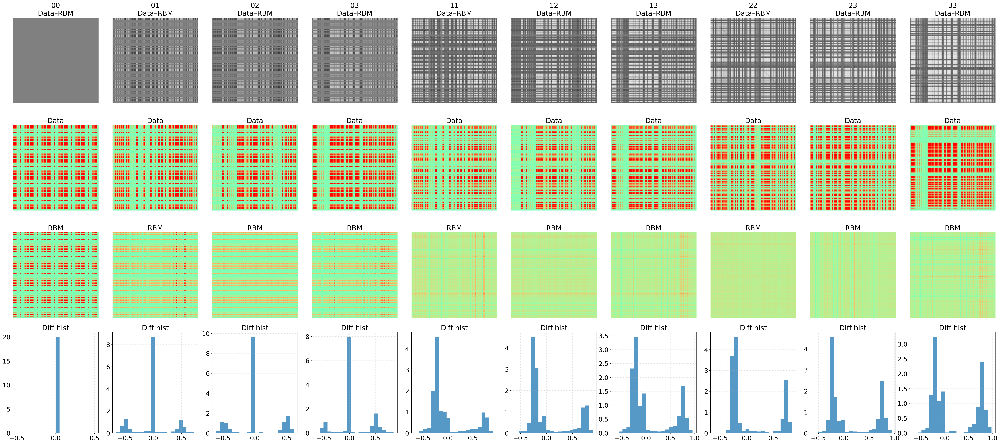

In [20]:
# Create a 3×6 grid of subplots
fig, axes = plt.subplots(4, 10, figsize=(40, 18))

for col, key in enumerate(corr_matrix_rbm.keys()):
    # Retrieve matrices, convert to NumPy if needed
    A = corr_matrix_data[key]
    B = corr_matrix_rbm[key]
    
    # Compute difference
    D = A - B

    # Top row: difference heatmap
    ax = axes[0, col]
    im = ax.imshow(D, vmin=-1, vmax=1, aspect='equal', cmap='gray')
    ax.set_title(f"{key}\nData–RBM", fontsize=20)
    ax.axis('off')

    # Middle row: original data
    ax = axes[1, col]
    ax.imshow(A, vmin=-1, vmax=1, aspect='equal', cmap='rainbow')
    ax.set_title("Data", fontsize=20)
    ax.axis('off')

    # Bottom row: RBM correlation
    ax = axes[2, col]
    ax.imshow(B, vmin=-1, vmax=1, aspect='equal', cmap='rainbow')
    ax.set_title("RBM", fontsize=20)
    ax.axis('off')
    
    # Bottom row: RBM correlation
    ax = axes[3, col]
    ax.hist(D.reshape(-1), bins=20, density=True, alpha=0.75)
    ax.set_title("Diff hist", fontsize=20)
    ax.xaxis.set_tick_params(labelsize=18)
    ax.yaxis.set_tick_params(labelsize=18)
    ax.grid(True, linestyle=':', alpha=0.5)

# Single colorbar alongside all plots
# cbar = fig.colorbar(im, ax=axes.ravel().tolist(), shrink=0.6, location='right')
# cbar.set_label("Correlation")

plt.tight_layout()
plt.show()

In [250]:
fpd_recon = [0.28171901775261654, 0.27610111297952855, 0.23623908580388636, 0.2210744808510937, 0.18644421826289684, 0.2030007466602672, 
                  0.21249611874140645, 0.16392233757991367, 0.14389478161185731, 
              0.15670347982957408, 0.14916755955246316, 0.09706627397032931, 0.09610074953743804, 0.10935985550777683, 0.1077773271212027, 0.07988435220504599, 
              0.1142615911016994, 0.07963256980948644, 0.0750136093510446, 0.10269223549619816] 

kpd_recon = [0.000892549225344208, 0.0017953303946163235, 0.0010429697587919229, 
            0.0009093175006329446, 0.0004692477270269446, 0.0009735575941149932, 0.0016466744829819469, 0.0005484693821053988, 0.0006027670358537129, 0.0007562910841800718, 
                0.0008838656391592092, 0.0004192771768365411, 0.00020511683985757756, 0.0008646527921194469, 0.0003581094360560755, 0.0005342887399362173, 0.0007419315984997787, 
        0.0002245765988551085, 0.00042751229226900556, 0.0007902208080936557] 

fpd_sample = [0.48096773085005806, 0.3718108700088141, 0.37650166790362044, 0.3479505446097048, 0.34596658390872476, 0.44710617801293384, 0.40850546523956555, 0.38031587221874746, 
 0.3257682143716862, 0.3709498476200523, 0.38889367929932067, 0.288115832475645, 0.32241090259853145, 0.327536084851494, 0.2594261109209164, 0.2876938331315209, 0.2564994782260478, 
 0.2499819887674952, 0.22732364238315678, 0.2630711326749494] 

kpd_sample = [0.00124464236567845, 0.0010139166251146303, 0.0012324611911749273, 0.0008619664358660017, 0.0005746508741659717, 0.0013796107676395941, 0.0014673544850958287, 
 0.0007810221316344457, 0.00038526855870690824, 0.0006919908154248144, 0.001003406636027382, 0.00043925249934551047, 0.0005983531507078865, 0.0008815426290198491, 
 0.00023949975044801342, 0.000662055804498074, 0.0005166656823947235, 0.000418112578051133, 0.00048036208621060617, 0.0007911744915098939]

f_rbm_IanOG = {"array5" : kpd_sample, "array4" : fpd_sample}

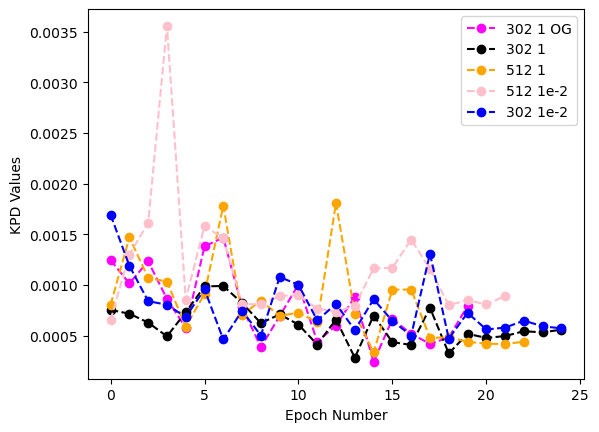

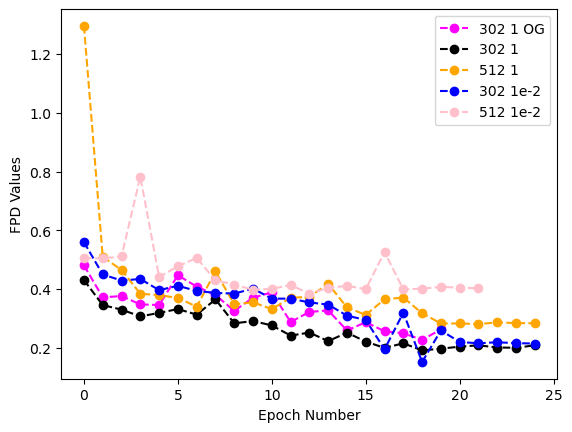

In [262]:


f_rbmHint = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-06-11/20-46-13/wandb/run-20250611_204614-4f745nwj/files/JetData.npz")

f_rbm_Ian = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-05-05/12-28-38/wandb/run-20250505_122838-yxe5n555/files/JetData.npz")

f_rbm512_1 = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-05-23/20-20-11/wandb/run-20250523_202012-edavl0yy/files/JetData.npz")

f_rbm512_001 = np.load("/home/javier/Projects/CaloQVAE/outputs/2025-06-06/21-52-55/wandb/run-20250609_212029-6frlej5z/files/JetData.npz")

plt.plot(f_rbm_IanOG["array5"], '--o', color='magenta', label='302 1 OG')
plt.plot(f_rbm_Ian["array5"], '--o', color='black', label='302 1')
plt.plot(f_rbm512_1["array5"][1:-1], '--o', color='orange', label='512 1')
plt.plot(f_rbm512_001["array5"][1:-1], '--o', color='pink', label='512 1e-2')
plt.plot(f_rbmHint["array5"], '--o', color='blue', label='302 1e-2')

# plt.plot(f_rbm_sa["array5"], '--o', label='correct RBM gradient + noise')
plt.xlabel('Epoch Number')
plt.ylabel('KPD Values')
# plt.axhline(y=0.00057, color='r', linestyle='-')
plt.legend()
plt.show()

plt.plot(f_rbm_IanOG["array4"], '--o', color='magenta', label='302 1 OG')
plt.plot(f_rbm_Ian["array4"], '--o', color='black', label='302 1')
plt.plot(f_rbm512_1["array4"], '--o', color='orange', label='512 1')
plt.plot(f_rbmHint["array4"], '--o', color='blue', label='302 1e-2')
plt.plot(f_rbm512_001["array4"][1:-1], '--o', color='pink', label='512 1e-2')

# plt.plot(f_rbm_sa["array5"], '--o', label='correct RBM gradient + noise')
plt.xlabel('Epoch Number')
plt.ylabel('FPD Values')
# plt.yscale("log")
# plt.axhline(y=0.00057, color='r', linestyle='-')
plt.legend()
plt.show()

In [18]:
###Eq
